# 정현석 일차 비전 스터디 ! 

- code로 배우는 딥러닝 필수 opencv 스킬

## 패키지 import 

In [1]:
!pip install numpy
!pip install matplotlib
!pip3 install opencv-python

In [2]:
import numpy as np
import matplotlib.pyplot as plt
import cv2

from IPython.display import Image
from IPython.core.display import HTML

## opencv는 사진을 BGR로 저장합니다..!

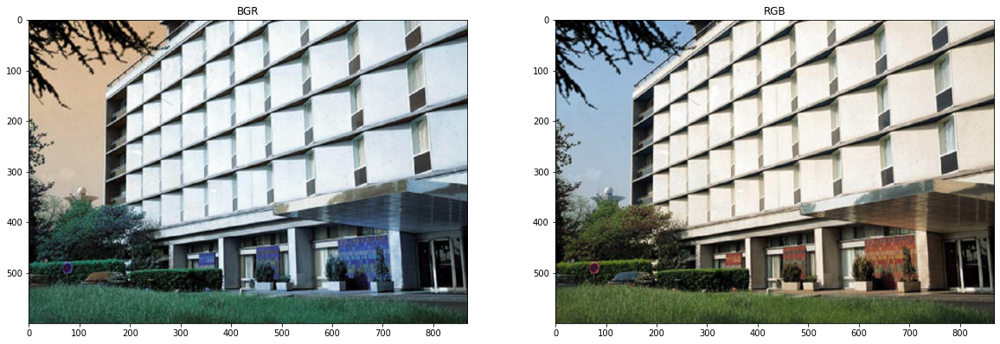

In [3]:
# image imread
image = cv2.imread('./data/building.jpg')

# original image
plt.figure(figsize=(20, 20))
plt.subplot(1, 2, 1)
plt.title('BGR')
plt.imshow(image)

# cvtColor image
plt.subplot(1, 2, 2)
plt.title('RGB')
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
plt.imshow(image)

In [4]:
# Opencv는 왜 BGR포맷을 쓸까? TMI
"""
openCV의 창시자 그레이 브라드스키 박사
별다른 이유가 없다... BGR..
초창기 카메라 산업 개빌자들이 BGR을 많이 썻기 떄문...

초창기 산업 개발자들은 why BGR을 많이 사용했을까?
Endianness와 관련이 있음
CPU에 따라 값을 메모리에 저장하고 읽을떄, 
큰 값을 먼저 쓰는 빅엔디안과 (MSB),
작은 값을 먼저 쓰는 리틀엔디언 방식(LSB)이 있는데

인텔에서 만든 x86 계열의 cpu는 리틀엔디언을 따름(openCV는 인텔의 작품..)

BGR 포맷으로 이루어진 색상 정보는 각 채널당 8비트로 이루어 지고 
3개의 채널을 사용하므로 24비트 즉, 0xBBGGRR가 필요합니다. 
24비트 단위의 입출력은 효과적이지 않으니 
1
메모리에 저장할때 unsigned 32비트를 사용하는것이 
일반적인데 이렇게 되면 0x00BBGGRR 가 됩니다.

이 값을 x86 계열의 CPU 처럼 리틀엔디언을 사용해서 저장하면 메모리에는  
0xRRGGBB00가 저장됩니다.
"""

print('')

# 1.Sharpening Filter
- kernels을 사용해서 가장자리를 강하고 강조해준다.
- 블러가 있는 이미지의 디테일을 살려준다.
- 필터는 가장자리 밝기를 높이는데 사용된다.

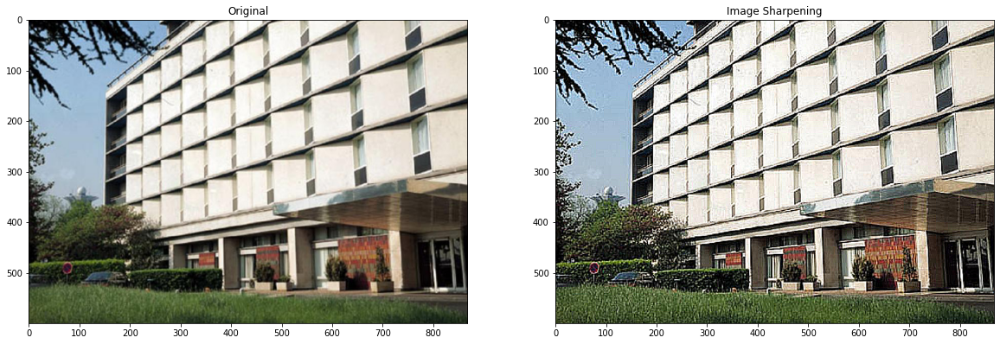

In [5]:
plt.figure(figsize=(20, 20))
plt.subplot(1, 2, 1)
plt.title('Original')
plt.imshow(image)

# Create our shapening kernerl we don't normalizer since the 
# the values in the matrix to 1 
kernel_sharpening = np.array([[-1, -1, -1],
                              [-1, 9 , -1],
                              [-1, -1, -1]])

# applying different kernels to the input image
sharpened = cv2.filter2D(image, -1, kernel_sharpening)
plt.subplot(1, 2, 2)
plt.title("Image Sharpening")
plt.imshow(sharpened)

plt.show()


# 2. Thresholding, Binarization & Adaptive Thresholding

# 이미지 임계처리 이진화 방법 
- 기본 임계처리 방법
- 이진화 : 영상을 흑/백으로 분류하여 처리
- 임계값을 어떻게 결정할지가 매우 중요한 문제 
- 임계값 보다 크면 백, 작은면 흑
- 기본 임계처리는 매우 단순한 형태


# cv2.threshold(src, thresh, maxval, type)
    - thersh : 임계값
    - maxval : 임계값을 넘었을때 적용할 value
    - type : thresholding type
       - cv2.THRESH_BINARY: threshold보다 크면 value이고 아니면 0으로  
       - cv2.THRESH_BINARY_INV: threshold보다 크면 0이고 아니면 value로 
       - cv2.THRESH_TRUNC: threshold보다 크면 value로 지정하고 작으면 기존의 값 그대로 
       - cv2.THRESH_TOZERO: treshold_value보다 크면 픽셀 값 그대로 작으면 0으로 
       - cv2.THRESH_TOZERO_INV: threshold_value보다 크면 0으로 작으면 그대로 
   


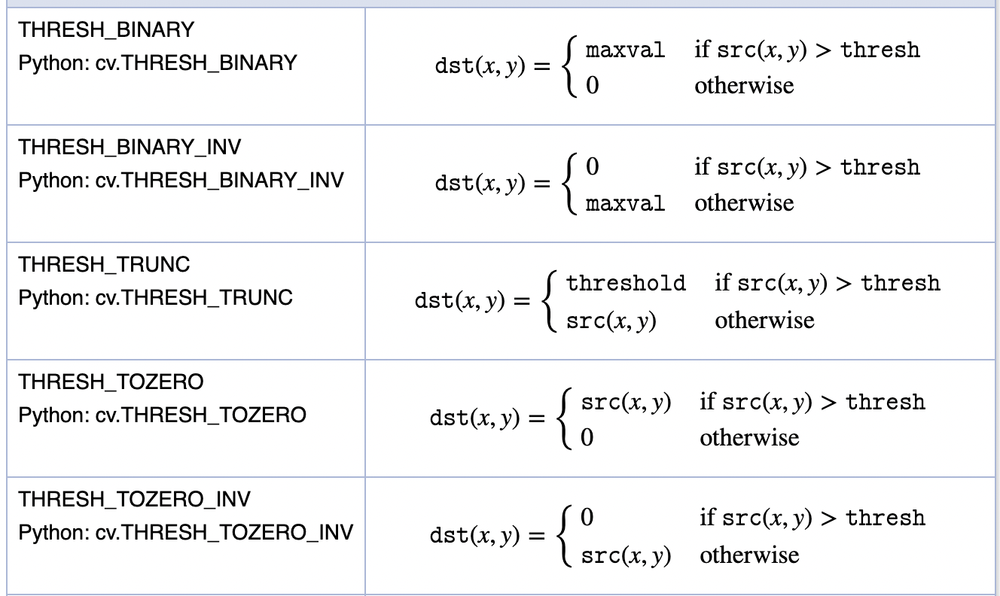

In [6]:
Image('thresh.png')

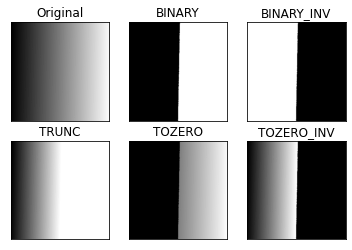

In [7]:
import cv2
import numpy as np
from matplotlib import pyplot as plt

img = cv2.imread('./data/gradient.png',0)

ret, thresh1 = cv2.threshold(img,127,255, cv2.THRESH_BINARY)
ret, thresh2 = cv2.threshold(img,127,255, cv2.THRESH_BINARY_INV)
ret, thresh3 = cv2.threshold(img,127,255, cv2.THRESH_TRUNC)
ret, thresh4 = cv2.threshold(img,127,255, cv2.THRESH_TOZERO)
ret, thresh5 = cv2.threshold(img,127,255, cv2.THRESH_TOZERO_INV)

titles =['Original','BINARY','BINARY_INV','TRUNC','TOZERO','TOZERO_INV']
images = [img,thresh1,thresh2,thresh3,thresh4,thresh5]

for i in range(6):
    plt.subplot(2,3,i+1)
    plt.imshow(images[i],'gray')
    plt.title(titles[i])
    plt.xticks([]),plt.yticks([])

plt.show()

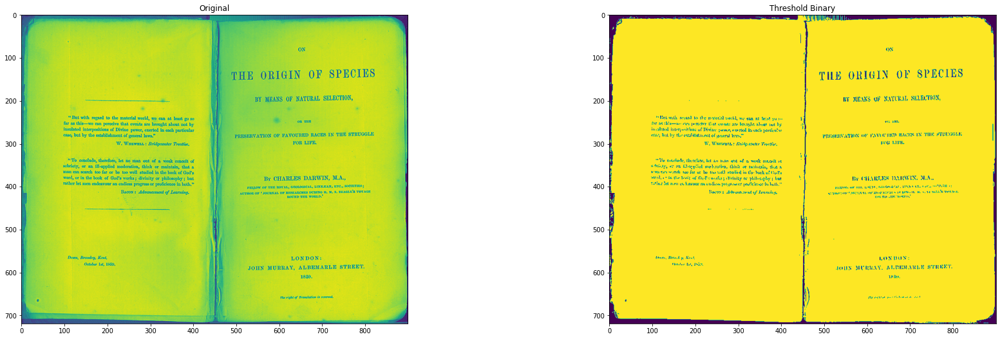

In [8]:
"""
cv2.imread(fileName, flag) --> return nump array

flag 
cv2.IMREAD_COLOR : 이미지 파일을 Color 값으로 불러옵니다(DeFault)
cv2.IMREAD_GRAYSCALRE : 이미지 Grayscale로 불러옵니다.
cv2.IMREAD_UNCHANGED : 이미지 파일을 alpha channel까지 불러옵니다.

flag 대신 1, 0, -1 로 읽기도 합니다
"""

image = cv2.imread('./data/Origin_of_Species.jpeg', 0)

plt.figure(figsize=(30, 30))
plt.subplot(3,2,1)
plt.title('Original')
plt.imshow(image)

ret, thresh1 = cv2.threshold(image, 127, 255, cv2.THRESH_BINARY)
plt.subplot(3,2,2)
plt.title("Threshold Binary")
plt.imshow(thresh1)


# 적응 임계처리 
- 단순 임계처리의 가장 큰 문제 한가지 기준으로 적용하면, 
- 이미지에 음영이 다르면 일부 영역이 모두 흰색 or 검정색으로 보여짐
- 이런 문제를 해결하기 위해 이미지의 작은 영역별로 thresholding 

### cv2.adaptiveThreshold(src, maxValue, adaptiveMethod, thresholdType, blockSize, C)
- maxValue : 임계값
- adaptiveMethod – thresholding value를 결정하는 계산 방법
- thresholdType – threshold type
- blockSize – thresholding을 적용할 영역 사이즈
- C – 평균이나 가중평균에서 차감할 값

### Adaptive Method 
- cv2.ADAPTIVE_THRESH_MEAN_C : 주변영역의 평균값으로 결정
- cv2.ADAPTIVE_THRESH_GAUSSIAN_C :blockSize 영역의 모든 픽셀에 중심점으로부터의 거리에 대한 가우시안 가중치 적용

In [9]:
# 1차원 가우시안 분포(왼쪽) ->  평균값 : 0, 표준편차 : 1
Image(url='https://t1.daumcdn.net/cfile/tistory/2122D950539942B63A?download')


In [10]:
# 2차원 가우시안 분포(오른쪽) -> 평균값 : (0,0), 표준편차 : 1
Image(url='https://t1.daumcdn.net/cfile/tistory/27072F50539942B616?download')

In [11]:
# ret : frame으로 정보 받는지 여부 확인 

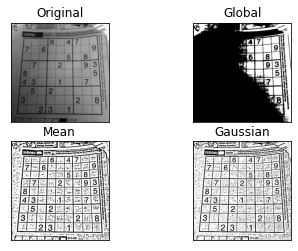

In [12]:
img = cv2.imread('./data/sudoku.png', 0)
# img = cv2.medianBlur(img,5)

ret, th1 = cv2.threshold(img,127,255,cv2.THRESH_BINARY)
th2 = cv2.adaptiveThreshold(img,255,cv2.ADAPTIVE_THRESH_MEAN_C,\
cv2.THRESH_BINARY,15,2)
th3 = cv2.adaptiveThreshold(img,255,cv2.ADAPTIVE_THRESH_GAUSSIAN_C,\
cv2.THRESH_BINARY,15,2)

titles = ['Original','Global','Mean','Gaussian']

images = [img,th1,th2,th3]

for i in range(4):
    plt.subplot(2,2,i+1),plt.imshow(images[i],'gray')
    plt.title(titles[i])
    plt.xticks([]),plt.yticks([])
plt.show()

# 영상에 블러링(가우시안 필터)
- 평균값 필터는 가까이 있는 픽셀과 멀리 있는 픽셀 모두 같은 가중치를 사용 평균 계산
- 멀리 있는 픽셀의 영향을 많이 받아 퀄리티 낮아짐
- 단점 보안을 위해 가우시안 필터 사용 


In [13]:
Image(url='https://blog.kakaocdn.net/dn/3hxC7/btqJU4lkGql/DctAZcntV6dKoG0JaSgZYK/img.png')

# 가우시안 필터를 왜 쓸까?
- 영상 처리에 가장 중요한것이 노이즈 제거 
- 가장 쉬운 방법은 가우시안 필터
- 중앙값에 가중치를 더 주고 주변은 더 흐리게 한다고 보면된다

### cv2.GaussianBlur(img, ksize, sigmaX)
- img 
- kszie : 커널 사이즈
- sigmaX : 0으로 하면 지정한 커널 크기에 맞춰 시그마 계산 

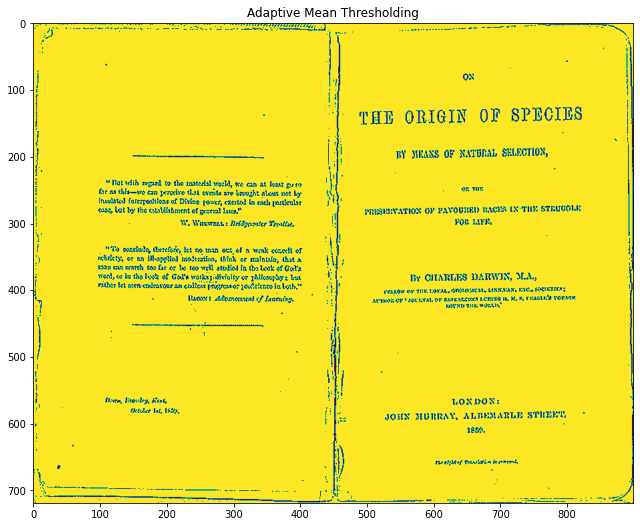

In [14]:
image = cv2.GaussianBlur(image, (3,3), 0)
thresh = cv2.adaptiveThreshold(image, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C,
                              cv2.THRESH_BINARY, 3, 5)
plt.figure(figsize=(30,30))
plt.subplot(3,2,3)
plt.title('Adaptive Mean Thresholding')
plt.imshow(thresh)

# Otsu의 이진화
- thresholding 처리 하면서 임계값을 사용자가 결정하여 parameter로 전달 하였습니다
- bimodal image (히스토그램으로 분석하면 2개의 peak가 있는 이미지)의 경우는 히스토그램에서
- 임계값을 어느정도 정확히 계산 할 수 있습니다
- Otsu의 이진화(Otsu’s Binarization)란 bimodal image에서
- 임계값을 자동으로 계산해주는 것을 말합니다.

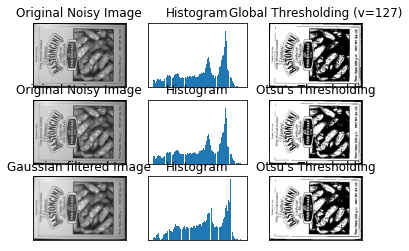

In [16]:
import cv2
import numpy as np 
from matplotlib import pyplot as plt 

img = cv2.imread('./data/box.png',0)

# global thresholding
ret1, th1 = cv2.threshold(img, 127, 255, cv2.THRESH_BINARY)

ret2, th2 = cv2.threshold(img, 0, 255, cv2.THRESH_BINARY+cv2.THRESH_OTSU)

blur = cv2.GaussianBlur(img,(5,5),0)

ret3, th3 = cv2.threshold(img, 0, 255, cv2.THRESH_BINARY+cv2.THRESH_OTSU)

# plot all the images and their histograms
images = [img, 0, th1, img, 0, th2, blur, 0, th3]

titles = ['Original Noisy Image','Histogram','Global Thresholding (v=127)', 'Original Noisy Image','Histogram',"Otsu's Thresholding", 'Gaussian filtered Image','Histogram',"Otsu's Thresholding"]

for i in range(3):
    plt.subplot(3,3,i*3+1),plt.imshow(images[i*3],'gray')
    plt.title(titles[i*3]), plt.xticks([]), plt.yticks([])
    plt.subplot(3,3,i*3+2),plt.hist(images[i*3].ravel(),256)
    plt.title(titles[i*3+1]), plt.xticks([]), plt.yticks([])
    plt.subplot(3,3,i*3+3),plt.imshow(images[i*3+2],'gray')
    plt.title(titles[i*3+2]), plt.xticks([]), plt.yticks([])

plt.show()

# 3.Dilation, Erosion, Opening and Closing

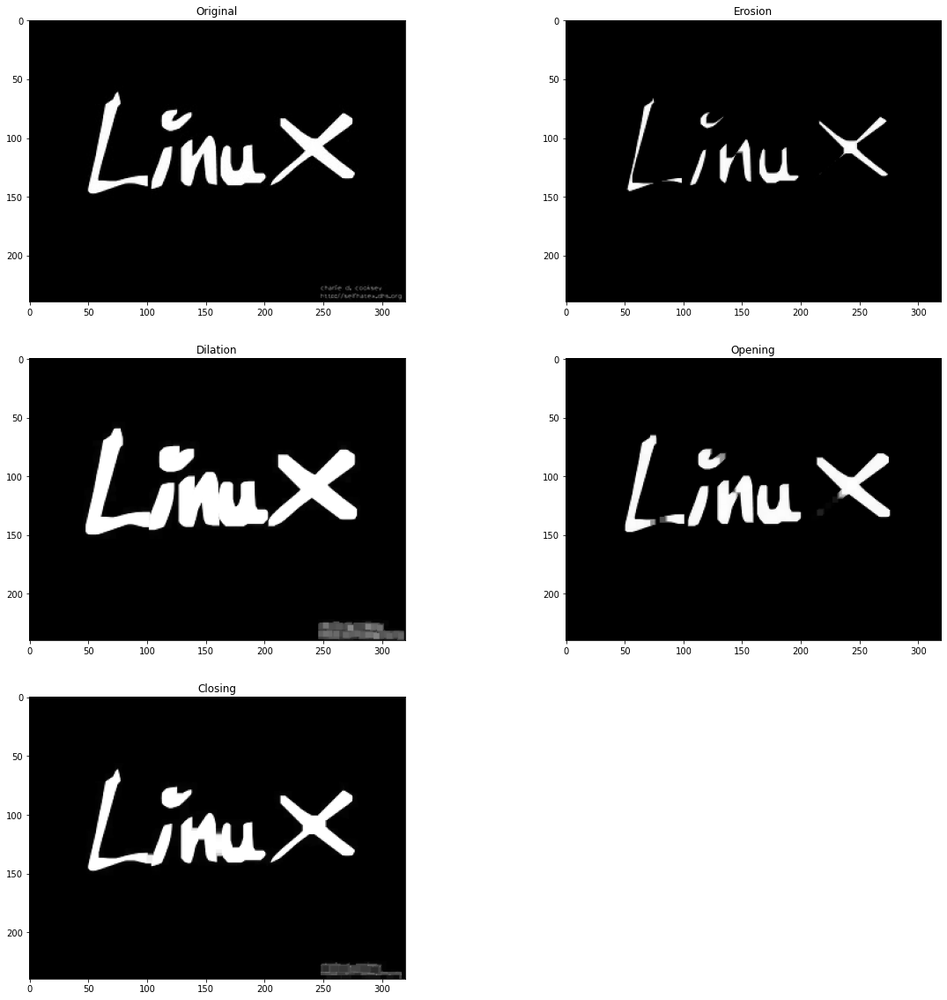

In [17]:
image = cv2.imread('./data/LinuxLogo.jpg')
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

plt.figure(figsize=(20, 20))
plt.subplot(3, 2, 1)
plt.title("Original")
plt.imshow(image)


# Let's define our kernel size
kernel = np.ones((5,5), np.uint8)

# erode 침식 기존 객체의 영역을 깍아 내는 연산 객체 크기 감소
# 구조 요소를 입력 영상에 적용해서 정확히 핏이 맞으면 해당 픽셀 255, 그외 0
erosion = cv2.erode(image, kernel, iterations = 1)

plt.subplot(3, 2, 2)
plt.title("Erosion")
plt.imshow(erosion)

# dilate 기존 객체의 영역을 확장하는 연산 객체의 크기가 증가
# 구조 요소를 입력 영상에 적용하여 겹치는 부분의 위치에 255
# 아닌 곳을 0으로
dilation = cv2.dilate(image, kernel, iterations = 1)
plt.subplot(3, 2, 3)
plt.title("Dilation")
plt.imshow(dilation)


# Opening - Good for removing noise
# erode 적용후 dilate 적용 흰색 노이즈 제거에 사용
opening = cv2.morphologyEx(image, cv2.MORPH_OPEN, kernel)
plt.subplot(3, 2, 4)
plt.title("Opening")
plt.imshow(opening)

# colsing 연산 dilate 적용후 erode 적용 
# 검은색 노이즈 제거하는데 사용됨
# Closing - Good for removing noise
closing = cv2.morphologyEx(image, cv2.MORPH_CLOSE, kernel)
plt.subplot(3, 2, 5)
plt.title("Closing")
plt.imshow(closing)

# 4.Edge Detection & Image Gradients

# 엣지 검출과 미분
- 엣지 
- 픽셀의 밝기 값이 급격하게 변하는 부분
- 객체와 객체, 객체와 배경의 어떤 경계를 나타내는 용어
- 영상에 미분을 하는 이유도 엣지를 검출하기 위함

# 기초적인 에지 검출 방법
- 영상을 (x,y) 변수의 함수로 간주, 1차 미분 값이 크게 나타 나느 부분을 검춤
- 검출한 미분 값에 T 임계값을 설정해주는 것이 중요
- 임계값 보다 높으면 에지로 판단한다

# 소벨 필터 
- 3*3 마스크 가중치를 적용
- 샤를 필터가 미분 효과가 더 좋타고 하지만 소벨 필터가 직관적이라 소벨을 많이 사용

## cv2.Sobel(src, ddepth, dx, dy, dst=None, ksize=None, scale=None, delta=None, borderType=None) -> dst

- src: 입력 영상
- ddepth: 출력 영상 데이터 타입. -1이면 입력 영상과 같은 데이터 타입을 사용.
- dx: x 방향 미분 차수. 1차미분할지 2차미분 할지 결정
- dy: y 방향 미분 차수.
- dst: 출력 영상(행렬)
- ksize: 커널 크기. 기본값은 3.
- scale 연산 결과에 추가적으로 곱할 값. 기본값은 1.
- delta: 연산 결과에 추가적으로 더할 값. 기본값은 0.
- borderType: 가장자리 픽셀 확장 방식. 기본값은 cv2.BORDER_DEFAULT.


### cv2.Scharr(src, ddepth, dx, dy, dst=None, scale=None, delta=None, borderType=None) -> dst

- src: 입력 영상
- ddepth: 출력 영상 데이터 타입. -1이면 입력 영상과 같은 데이터 타입을 사용.
- dx: x 방향 미분 차수
- dy: y 방향 미분 차수.
- dst: 출력 영상(행렬)
- scale 연산 결과에 추가적으로 곱할 값. 기본값은 1
- delta: 연산 결과에 추가적으로 더할 값. 기본값은 0.
- borderType: 가장자리 픽셀 확장 방식. 기본값은 cv2.BORDER_DEFAULT

In [18]:
src = cv2.imread('./data/lena.jpg')

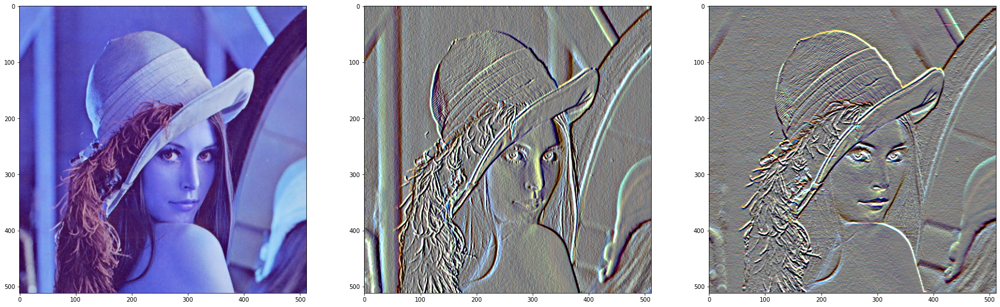

In [19]:
src = cv2.imread('./data/lena.jpg')

if src is None:
    print('Image load failed!')
    sys.exit()

# dx와 dy를 합쳐서 출력해야합니다.
dx = cv2.Sobel(src, -1, 1, 0, delta=128) # delta 값을 지정해주지 않으면 미분이 - 부분은 0
dy = cv2.Sobel(src, -1, 0, 1, delta=128)

plt.figure(figsize=(30,30))
plt.subplot(1,3,1)
plt.imshow(src)

plt.subplot(1,3,2)
plt.imshow(dx)

plt.subplot(1,3,3)
plt.imshow(dy)


In [20]:
image = cv2.imread('data/fruits.jpg')
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
height, width, channel = image.shape

sobel_x = cv2.Sobel(image, cv2.CV_64F, 0, 1, ksize=5)
sobel_y = cv2.Sobel(image, cv2.CV_64F, 1, 0, ksize=5)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


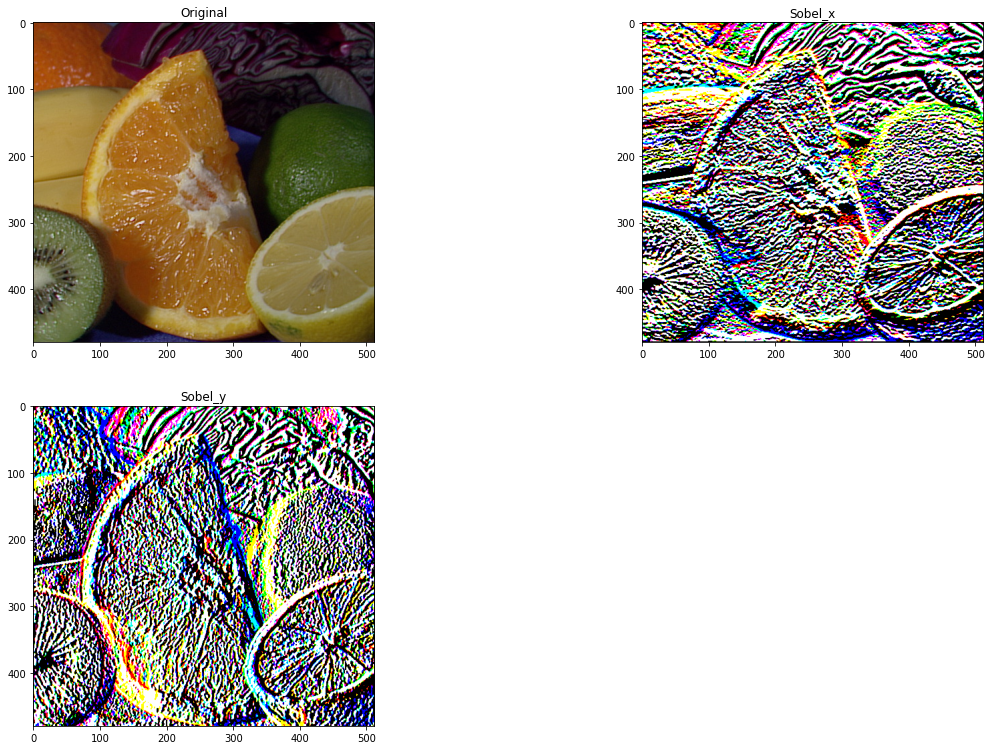

In [21]:
plt.figure(figsize=(20,20))
plt.subplot(3,2,1)
plt.title("Original")
plt.imshow(image)

plt.subplot(3,2,2)
plt.title("Sobel_x")
plt.imshow(sobel_x)

plt.subplot(3,2,3)
plt.title("Sobel_y")
plt.imshow(sobel_y)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


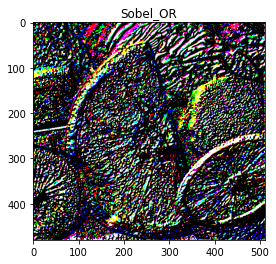

In [22]:
# 비트 연산 
# cv2.bitwise_or(sobel_x,sobel_y) 
sobel_OR = cv2.bitwise_or(sobel_x,sobel_y)

plt.title("Sobel_OR")
plt.imshow(sobel_OR)

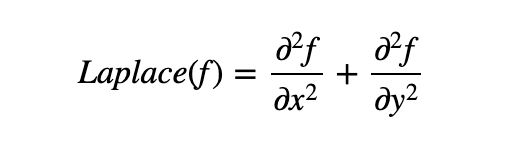

In [23]:
Image('laplace.png')

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


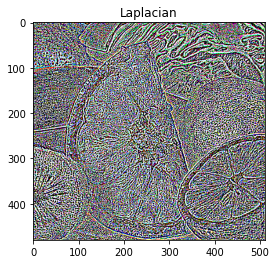

In [24]:
laplacian = cv2.Laplacian(image, cv2.CV_64F)

plt.title("Laplacian")
plt.imshow(laplacian)

# Canny Filter 
- cv2.Canny(gray_img, threshold1, threshold2)

https://docs.opencv.org/3.4/da/d22/tutorial_py_canny.html

- threshold2 : maxVal
    - threshold2의 쪽이 더욱 직감적인 값으로, 엣지인지 아닌지를 판단하는 임계값 그 자체이다.

- threshold1:minVal
    - 다른 엣지와의 인접 부분(엣지가 되기 쉬운 부분)의 엣지 여부를 판단하는 임계값
    - threshold1를 작은 값으로 설정하여도,
    - 원래 주변에 아무것도 검출되지 않았던 부분에 갑자기 엣지가 검출되지는 않는다.
    - 작은 값으로 설정하면, 원래 threshold2에 의해 검출된 엣지의 인접 부분이 엣지로 검출되기 쉬워져
    - 직감적으로 얘기하자면 원래 threshold2에 의해서 검출된 엣지의 선을 길게 늘릴 뿐이다.

### 외곽선(엣지) 검출 파라미터 조정을 하는 방법

1. 먼저 threshold1와 threshold2를 같은 값으로 한다.
2. 검출되길 바라는 부분에 엣지가 표시되는지 확인하면서 threshold2 값을 조정한다.
3. 2번의 조정이 끝나면, threshold1를 사용하여 엣지를 연결시킨다. 


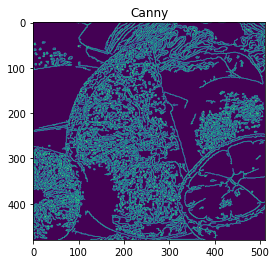

In [25]:
canny = cv2.Canny(image, 50, 120)
plt.title("Canny")
plt.imshow(canny)

In [26]:
image = cv2.imread('./data/scan.jpeg')
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

# 5.Perpsective Transform


### AFFINE TRANSFORM
- 이미지를 2차원으로 뒤트는 변환 
- martix = cv2.getAffineTransform(pts1, pts2)
- pts1: 변환 전 영상의 좌표 3개, 3 x 2 배열
- pts2: 변환 후 영상의 좌표 3개, 3 x 2 배열
- matrix: 변환 행렬 반환, 2 x 3 행렬

# ex
- pts1 = np.float32([[100, 50], [200, 50], [100, 200]])
- pts2 = np.float32([[80, 70], [210, 60], [250, 120]])

In [27]:
Image(url="https://076923.github.io/assets/posts/C-Sharp/OpenCvSharp4/lecture-21/2.webp")

# 원근 변환(Perspective Transform)
-  이미지를 3차원으로 변환
- mtrx = cv2.getPerspectiveTransform(pts1, pts2)
- pts1: 변환 이전 영상의 좌표 4개, 4 x 2 배열
- pts2: 변환 이후 영상의 좌표 4개, 4 x 2 배열
- mtrx: 변환행렬 반환, 3 x 3 행렬

In [28]:
Image(url='https://076923.github.io/assets/posts/C-Sharp/OpenCvSharp4/lecture-22/2.webp')

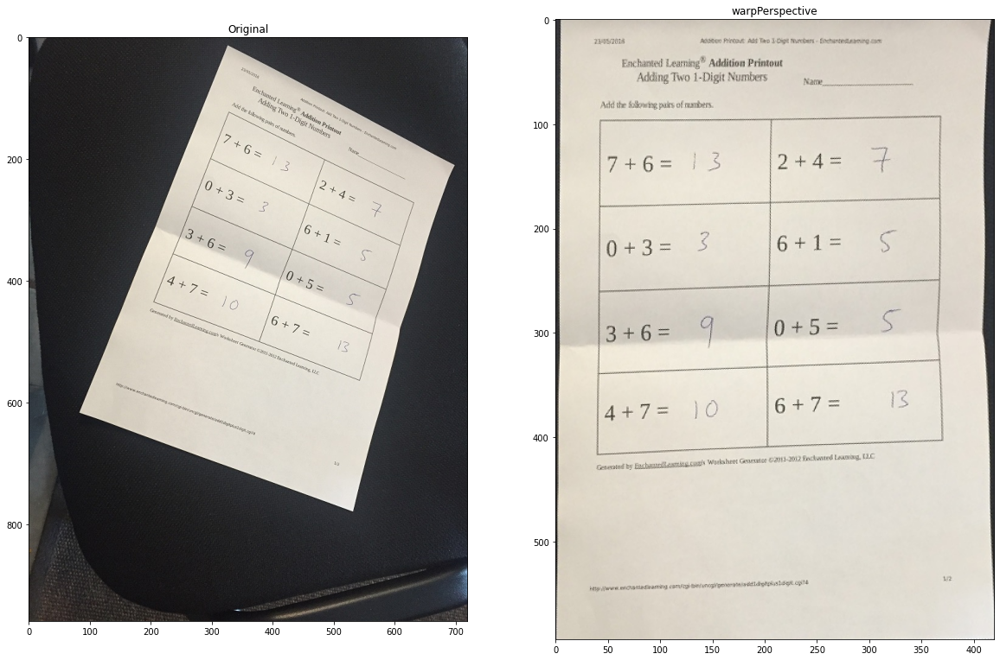

In [29]:
image = cv2.imread('./data/scan.jpeg')
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

plt.figure(figsize=(20, 20))

plt.subplot(1, 2, 1)
plt.title("Original")
plt.imshow(image)

# Cordinates of the 4 corners of the original image
points_A = np.float32([[320,15], [700,215], [85,610], [530,780]])

# Cordinates of the 4 corners of the desired output
# We use a ratio of an A4 Paper 1 : 1.41
points_B = np.float32([[0,0], [420,0], [0,594], [420,594]])
 
# Use the two sets of four points to compute 
# the Perspective Transformation matrix, M  
M = cv2.getPerspectiveTransform(points_A, points_B)
 
    
# warpPerspective
# cv2.warpPerspective(src, M, dsize, dst, flags, borderMode, borderValue)
# flags : 보간법
# borderMode : 테두리 외삽법
# borderValue : 테두리 색상
warped = cv2.warpPerspective(image, M, (420,594))

plt.subplot(1, 2, 2)
plt.title("warpPerspective")
plt.imshow(warped)


# 6.Scaling, re-sizing and interpolations

### cv2.resize(src, dsize, dst=None, fx=None, fy=None, interpolation=None) 

- interpolation: 보간법 지정. 기본값은 cv2.INTER_LINEAR
  
- cv2.INTER_NEAREST : 최근방 이웃 보간법
    -  가장 빠르지만 퀄리티가 많이 떨어집니다. 따라서 잘 쓰이지 않습니다
- cv2.INTER_LINEAR - 양선형 보간법(2x2 이웃 픽셀 참조)
    -  4개의 픽셀을 이용합니다. 효율성이 가장 좋습니다. 속도도 빠르고 퀄리티도 적당합니다.
- cv2.INTER_CUBIC : 3차회선 보간법(4x4 이웃 픽셀 참조)
    -  16개의 픽셀을 이용합니다. cv2.INTER_LINEAR 보다 느리지만 퀄리티는 더 좋습니다.
- cv2.INTER_LANCZOS4 :  Lanczos 보간법 (8x8 이웃 픽셀 참조)
    -  64개의 픽셀을 이용합니다.좀더 복잡해서 오래 걸리지만 퀄리티는 좋습니다 -> 고품질!
- cv2.INTER_AREA : 영상 축소시 효과적
    - 영역적인 정보를 추출해서 결과 영상을 셋팅합니다. 영상을 축소할 때 이용합니다

## 보간 (Interpolation)이란?
- 새로운 점을 만들기 위해 수많은 점들을 평균화 시키는 것 
- (0, 0), (1, 10), (2, 20)이 주어졌을 때,
- 이들에 대한 근사 함수를 f(x) = 10x로 구하고, 1.5에 대한 함수 값으로 15를 구하는 것이다.

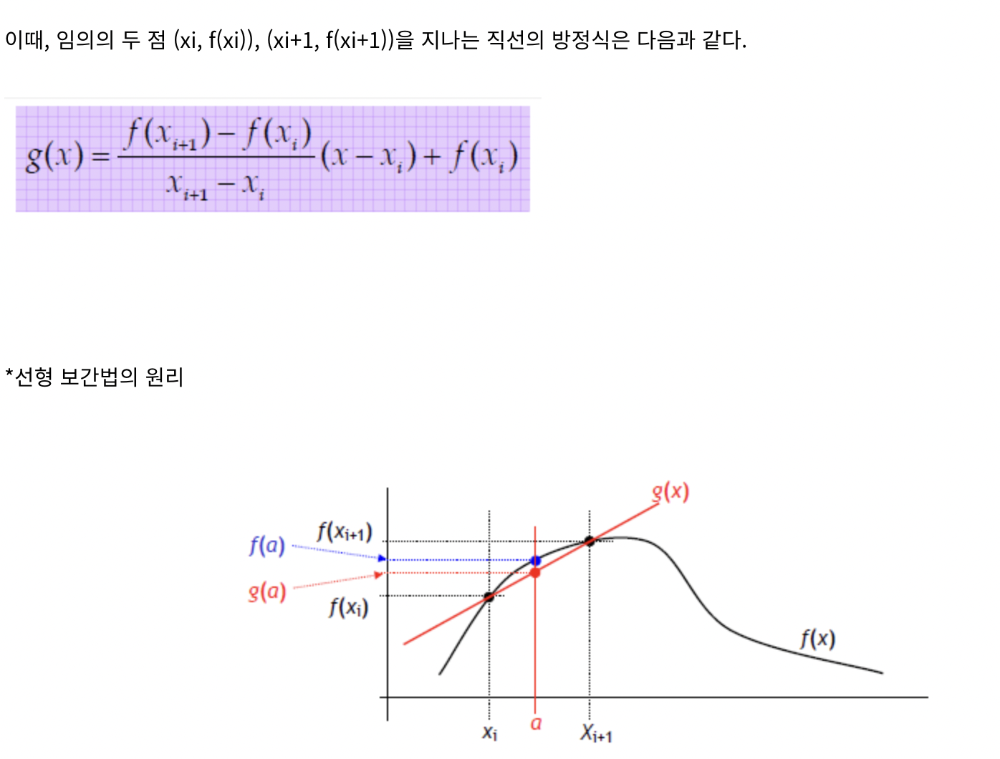

In [30]:
Image('linear_inter.png')

# 영상의 축소 시 고려할 사항
- 영상 축소 시 디테일이 사라지는 경우가 발생합니다.
- 한 픽셀로 구성된 성분이 축소를 하게 되면서 사라지는 경우가 바생합니다.
- 이를 해결하기 위해 입력 영상을 부드럽게 필터링한 후 축소를 하거나 여러번 축소를 반복합니다.
- OpenCV의 cv2.resize() 함수에서는 cv2.INTER_AREA 플래그를 사용합니다 (베스트)

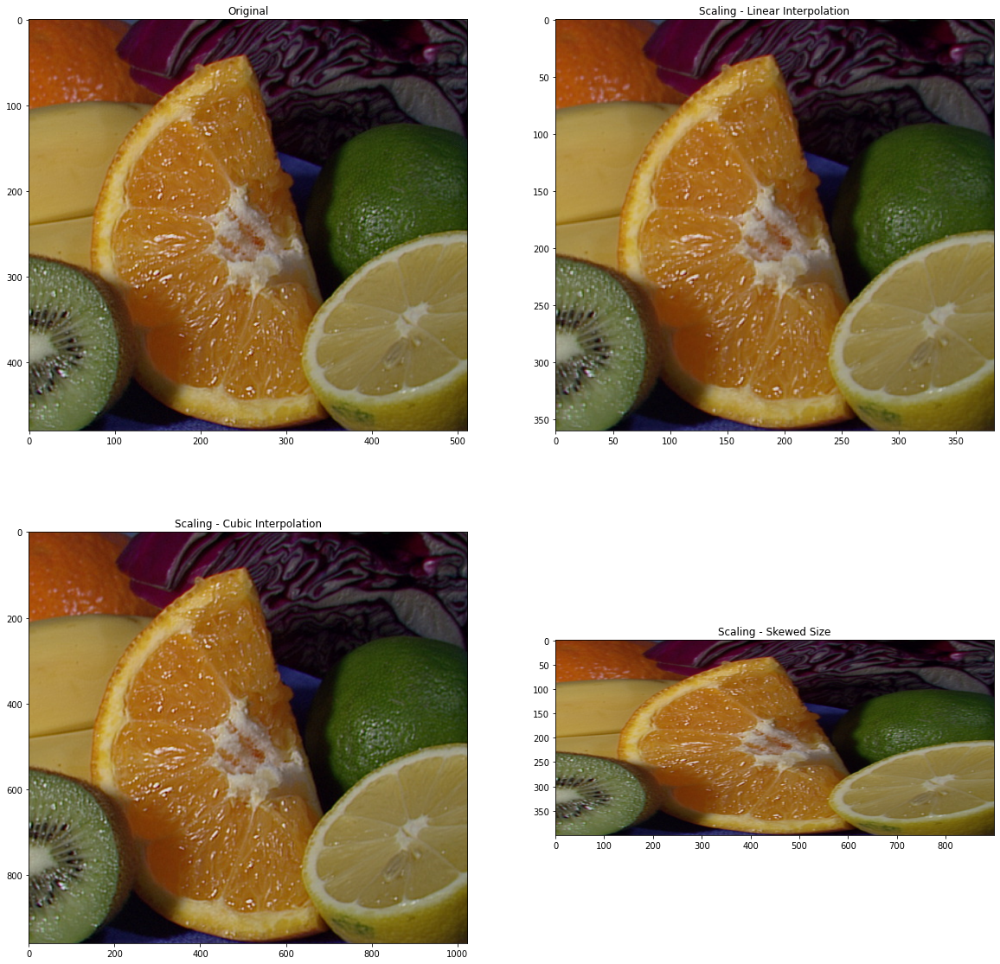

In [31]:
image = cv2.imread('./data/fruits.jpg')
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

plt.figure(figsize=(20, 20))

plt.subplot(2, 2, 1)
plt.title("Original")
plt.imshow(image)

# Let's make our image 3/4 of it's original size
image_scaled = cv2.resize(image, None, fx=0.75, fy=0.75)

plt.subplot(2, 2, 2)
plt.title("Scaling - Linear Interpolation")
plt.imshow(image_scaled)

# Let's double the size of our image
img_scaled = cv2.resize(image, None, fx=2, fy=2, interpolation = cv2.INTER_CUBIC)

plt.subplot(2, 2, 3)
plt.title("Scaling - Cubic Interpolation")
plt.imshow(img_scaled)

# Let's skew the re-sizing by setting exact dimensions
img_scaled = cv2.resize(image, (900, 400), interpolation = cv2.INTER_AREA)

plt.subplot(2, 2, 4)
plt.title("Scaling - Skewed Size")
plt.imshow(img_scaled)


# 7.Image Pyramids
- Useful when scaling images in object detection
- Gaussian Pyramid
- Laplacian Pyramids

In [32]:
Image(url="https://p3-juejin.byteimg.com/tos-cn-i-k3u1fbpfcp/706c3154b2074f9f893f19eb7b485a40~tplv-k3u1fbpfcp-zoom-1.image")

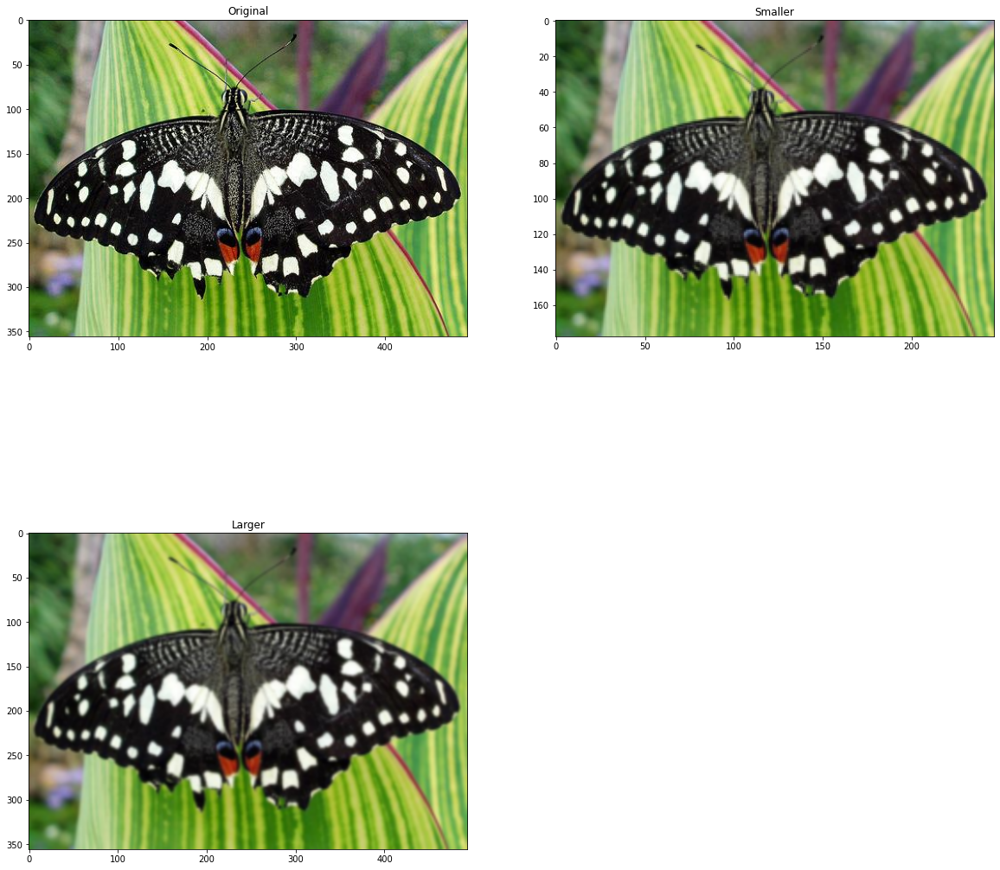

In [33]:
image = cv2.imread('./data/butterfly.jpg')
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

plt.figure(figsize=(20, 20))

plt.subplot(2, 2, 1)
plt.title("Original")
plt.imshow(image)

# cv2.pyrDown : 이미지 크기를 50% 줄여서 반환
smaller = cv2.pyrDown(image)
# cv2.pyrUp : 이미지 크기를 200% 키워서 반환
larger = cv2.pyrUp(smaller)

plt.subplot(2, 2, 2)
plt.title("Smaller")
plt.imshow(smaller)

plt.subplot(2, 2, 3)
plt.title("Larger")
plt.imshow(larger)

# 8.Cropping

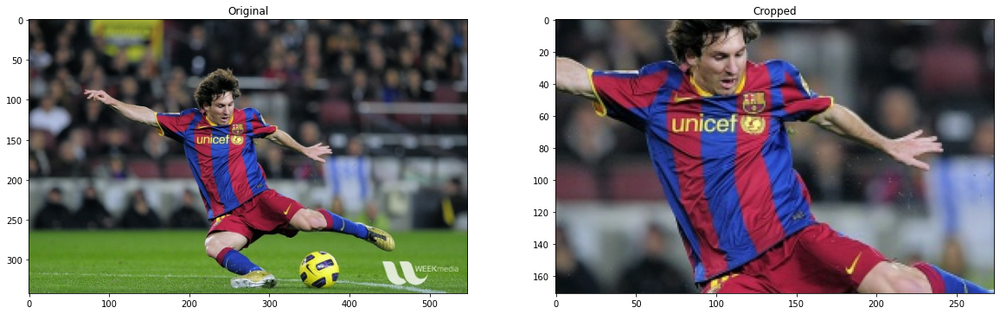

In [34]:
image = cv2.imread('./data/messi5.jpg')
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

plt.figure(figsize=(20, 20))

plt.subplot(2, 2, 1)
plt.title("Original")
plt.imshow(image)

height, width = image.shape[:2]

# Let's get the starting pixel coordiantes (top  left of cropping rectangle)
start_row, start_col = int(height * .25), int(width * .25)

# Let's get the ending pixel coordinates (bottom right)
end_row, end_col = int(height * .75), int(width * .75)

# Simply use indexing to crop out the rectangle we desire
cropped = image[start_row:end_row , start_col:end_col]


plt.subplot(2, 2, 2)
plt.title("Cropped")
plt.imshow(cropped)

# 9.Blurring

#### cv2.filter2D 파라미터 
- cv2.filter2D(src, ddepth, kernel, dst=None, anchor=None, delta=None, borderType=None) -> dst

- src : 입력 영상

- ddepth : 출력 영상 데이터 타입. (e.g) cv2.CV_8U, cv2.CV_32F, cv2.CV_64F, -1을 지정하면 src와 같은 타입의 dst 영상을 생성합니다.

- kernel: 필터 마스크 행렬. 실수형.

- anchor: 고정점 위치. (-1, -1)이면 필터 중앙을 고정점으로 사용

- delta: 추가적으로 더할 값

- borderType: 가장자리 픽셀 확장 방식

- dst: 출력 영상

In [35]:
## borderType

Image(url= "https://blog.kakaocdn.net/dn/bqCRsS/btqJVnLxfge/J6vzetwFK5P6NK18NekTD0/img.png")

In [36]:
### 커널 적용 방식

Image(url= "https://blog.kakaocdn.net/dn/dQUovh/btqJTGkHjtZ/RnYrfueInkT4kz9b2I4Ekk/img.png")

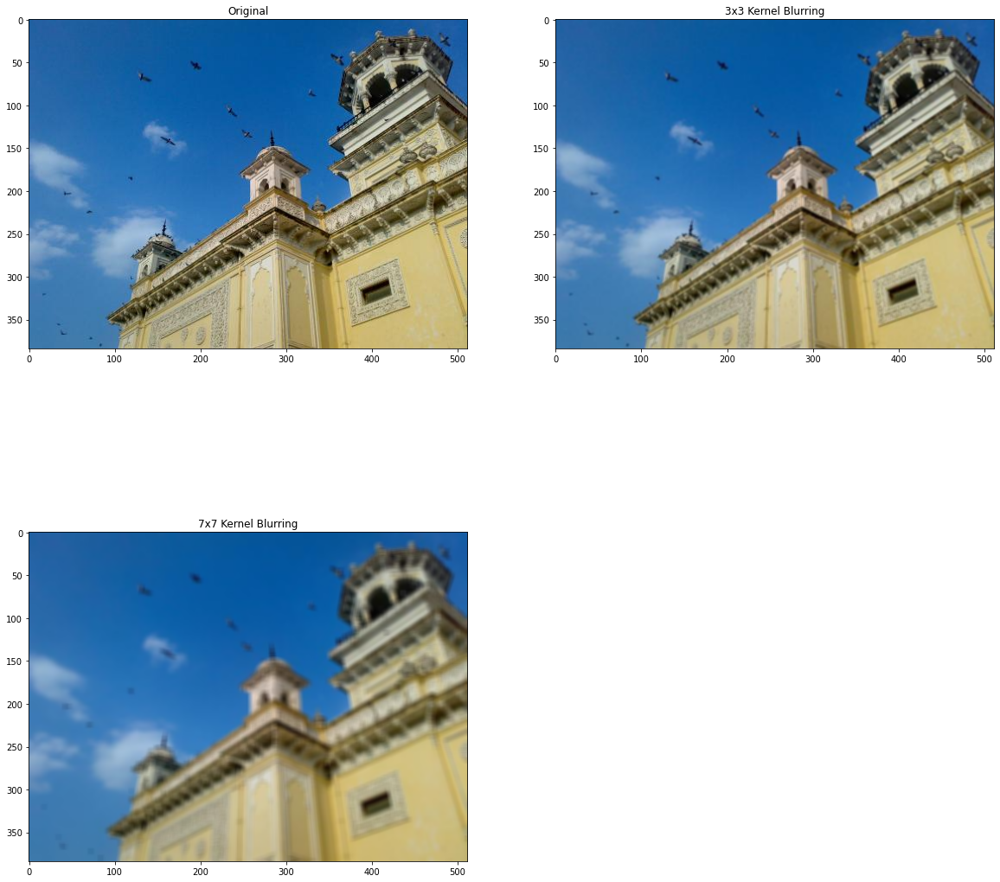

In [37]:
image = cv2.imread('./data/home.jpg')
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

plt.figure(figsize=(20, 20))

plt.subplot(2, 2, 1)
plt.title("Original")
plt.imshow(image)

# Creating our 3 x 3 kernel
kernel_3x3 = np.ones((3, 3), np.float32) / 9

# We use the cv2.fitler2D to conovlve the kernal with an image 
blurred = cv2.filter2D(image, -1, kernel_3x3)

plt.subplot(2, 2, 2)
plt.title("3x3 Kernel Blurring")
plt.imshow(blurred)

# Creating our 7 x 7 kernel
kernel_7x7 = np.ones((7, 7), np.float32) / 49

blurred2 = cv2.filter2D(image, -1, kernel_7x7)

plt.subplot(2, 2, 3)
plt.title("7x7 Kernel Blurring")
plt.imshow(blurred2)

# 10.Contours

# 외곽선 검출 
- 객체의 외곽선 좌표를 모두 추출하는 작업 

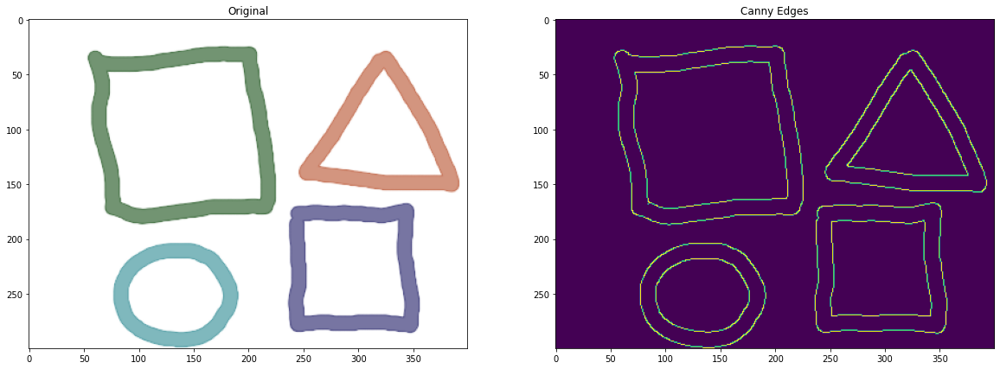

In [38]:
# Let's load a simple image with 3 black squares
image = cv2.imread('./data/pic3.png')
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

plt.figure(figsize=(20, 20))

plt.subplot(2, 2, 1)
plt.title("Original")
plt.imshow(image)

# Grayscale
gray = cv2.cvtColor(image,cv2.COLOR_BGR2GRAY)

# Find Canny edges
edged = cv2.Canny(gray, 30, 200)

plt.subplot(2, 2, 2)
plt.title("Canny Edges")
plt.imshow(edged)

### cv2.findContours(image, mode, method, contours=None,
### hierarchy=None, offset=None) -> contours, hierarchy

-  contours: 검출된 외곽선 좌표. numpy.ndarray로 구성된 리스트.
    - len(contours)=전체 외곽선 개수(N).
    
- hierarchy: 외곽선 계층 정보
    - hierarchy[0, i, 0] ~ hierarchy[0, i, 3] 순서로 
    - next, prev, child, parent 외곽선 인덱스를 가리킴. 
    - 외곽선이 없으면 -1
- offset : 좌표값 이동 옵셋, 기본값 (0,0)

Number of Contours found = 4


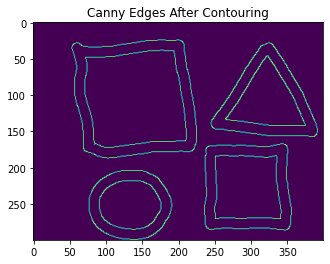

In [39]:
# Finding Contours
# Use a copy of your image e.g. edged.copy(), 
# since findContours alters the image

contours, hierarchy = cv2.findContours(edged, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_NONE)
print("Number of Contours found = " + str(len(contours)))
plt.title("Canny Edges After Contouring")
plt.imshow(edged)

# cv2.RETR_TREE : contour 추출 모드
# cv2.RETR_EXTERNAL : 이미지의 가장 바깥쪽의 contour만 추출

# cv2.CHAIN_APPROX_SIMPLE : contour 근사 방법
# cv2_CHAIN_APPROX_NONE : contour를 구성하는 모든 점을 저장함

### cv2.drawContours(image, contours, contourIdx, color, thickness=None, lineType=No

- image: 입출력 영상 
- contours: (cv2.findContours() 함수로 구한) 외곽선 좌표 정보
- contourIdx: 외곽선 인덱스. 음수(-1)를 지정하면 모든 외곽선을 그린다.
- color: 외곽선 색상 • thickness: 외곽선 두께. thinkness < 0이면 내부를 채운다.
- lineType: LINE_4, LINE_8, LINE_AA 중 하나 지정
- hierarchy: 외곽선 계층 정보.
- maxLevel: 그리기를 수행할 최대 외곽선 레벨. maxLevel = 0 이면 contourIdx로 지정된 외곽선만 그린다.


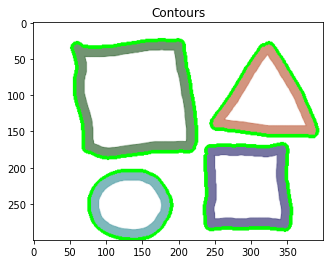

In [40]:
# Draw all contours
# Use '-1' as the 3rd parameter to draw all
cv2.drawContours(image, contours, -1, (0,255,0), 3)
plt.title("Contours")
plt.imshow(image)